<a href="https://colab.research.google.com/github/Knchna/Deep-Learning-Texture-Recognition-DTD/blob/main/DTD_Preprocessing_EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import Libraries

In [96]:
import os
import random
import warnings
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt     # Visualization
import matplotlib.image as mpimg

import cv2                          # Image Processing

from sklearn.preprocessing import LabelEncoder    # Machine Learning


import tensorflow as tf            # TensorFlow / Keras
import keras
from keras import layers, Sequential

# Display Settings
warnings.filterwarnings("ignore")
plt.rcParams["figure.figsize"] = (10,6)
print("TensorFlow Version :", tf.__version__)
print("OpenCV Version     :", cv2.__version__)
print("NumPy Version      :", np.__version__)
print("Pandas Version     :", pd.__version__)

TensorFlow Version : 2.20.0
OpenCV Version     : 5.0.0
NumPy Version      : 2.0.2
Pandas Version     : 2.2.2


## 1. Project Configuration

All project constants are defined here.  
Changing them here updates every subsequent section.  
These values MUST remain identical across  
- CNN notebook
- VGG16 notebook  
to ensure a fair comparison.

In [97]:
# Configuration
IMAGE_SIZE = (224,224)
BATCH_SIZE = 32
SEED = 42
NUM_CLASSES = 47
SPLIT_NUMBER = 1
AUTOTUNE = tf.data.AUTOTUNE

random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

print("Configuration Loaded Successfully")
print(f"Image Size : {IMAGE_SIZE}")
print(f"Batch Size : {BATCH_SIZE}")
print(f"Split      : {SPLIT_NUMBER}")

Configuration Loaded Successfully
Image Size : (224, 224)
Batch Size : 32
Split      : 1


In [98]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Dataset Paths & Verifying Structure

In [99]:
PROJECT_PATH = "/content/drive/MyDrive/Texture-Recognition-DTD"
DATASET_PATH = os.path.join(PROJECT_PATH,"dtd-data")
IMAGES_PATH = os.path.join(DATASET_PATH,"images")
LABELS_PATH = os.path.join(DATASET_PATH,"labels")
IMDB_PATH = os.path.join(DATASET_PATH,"imdb")
print(PROJECT_PATH)

/content/drive/MyDrive/Texture-Recognition-DTD


In [100]:
# Verify Dataset
assert os.path.exists(DATASET_PATH),"DTD folder not found."
assert os.path.exists(IMAGES_PATH),"Images folder missing."
assert os.path.exists(LABELS_PATH),"Labels folder missing."
assert os.path.exists(IMDB_PATH),"IMDB folder missing."

print("Dataset Found Successfully")
print()
print(os.listdir(DATASET_PATH))

Dataset Found Successfully

['labels', 'imdb', 'images']


In [101]:
# Read Label txt files to split the image dataset
train_file = os.path.join(
    LABELS_PATH,
    f"train{SPLIT_NUMBER}.txt"
)

val_file = os.path.join(
    LABELS_PATH,
    f"val{SPLIT_NUMBER}.txt"
)

test_file = os.path.join(
    LABELS_PATH,
    f"test{SPLIT_NUMBER}.txt"
)

In [102]:
# Helper Function

def load_split(filepath):
    """
    Reads DTD split txt file.
    Returns
    DataFrame
    """
    with open(filepath,"r") as f:
        image_paths = [line.strip() for line in f.readlines()]
    df = pd.DataFrame()
    df["relative_path"] = image_paths
    return df

In [103]:
# Load dataframes of the splits
train_df = load_split(train_file)
val_df = load_split(val_file)
test_df = load_split(test_file)

print("Training Images  :",len(train_df))
print("Validation Images:",len(val_df))
print("Testing Images   :",len(test_df))

Training Images  : 1880
Validation Images: 1880
Testing Images   : 1880


# extracting image labels

In [104]:
def extract_label(relative_path):
    return relative_path.split("/")[0]

for df in [train_df,val_df,test_df]:
    df["label"] = df["relative_path"].apply(extract_label)

In [105]:
def create_absolute_path(relative_path):
    return os.path.join(
        IMAGES_PATH,
        relative_path
    )


for df in [train_df,val_df,test_df]:
    df["filepath"] = df["relative_path"].apply(create_absolute_path)

In [106]:
# Inspect dataframe

display(train_df.head())
print()
display(val_df.head())
print()
display(test_df.head())

,relative_path,label,filepath
0,banded/banded_0005.jpg,banded,/content/drive/MyDrive/Texture-Recognition-DTD...
1,banded/banded_0011.jpg,banded,/content/drive/MyDrive/Texture-Recognition-DTD...
2,banded/banded_0013.jpg,banded,/content/drive/MyDrive/Texture-Recognition-DTD...
3,banded/banded_0019.jpg,banded,/content/drive/MyDrive/Texture-Recognition-DTD...
4,banded/banded_0021.jpg,banded,/content/drive/MyDrive/Texture-Recognition-DTD...


,relative_path,label,filepath
0,banded/banded_0006.jpg,banded,/content/drive/MyDrive/Texture-Recognition-DTD...
1,banded/banded_0009.jpg,banded,/content/drive/MyDrive/Texture-Recognition-DTD...
2,banded/banded_0010.jpg,banded,/content/drive/MyDrive/Texture-Recognition-DTD...
3,banded/banded_0012.jpg,banded,/content/drive/MyDrive/Texture-Recognition-DTD...
4,banded/banded_0016.jpg,banded,/content/drive/MyDrive/Texture-Recognition-DTD...


,relative_path,label,filepath
0,banded/banded_0002.jpg,banded,/content/drive/MyDrive/Texture-Recognition-DTD...
1,banded/banded_0004.jpg,banded,/content/drive/MyDrive/Texture-Recognition-DTD...
2,banded/banded_0008.jpg,banded,/content/drive/MyDrive/Texture-Recognition-DTD...
3,banded/banded_0034.jpg,banded,/content/drive/MyDrive/Texture-Recognition-DTD...
4,banded/banded_0036.jpg,banded,/content/drive/MyDrive/Texture-Recognition-DTD...


In [107]:
# Dataset Summary

dataset_summary = pd.DataFrame({
    "Split": ["Train", "Validation", "Test"],
    "Images": [len(train_df), len(val_df), len(test_df)],
    "Classes": [
        train_df["label"].nunique(),
        val_df["label"].nunique(),
        test_df["label"].nunique()
    ]
})

display(dataset_summary)

,Split,Images,Classes
0,Train,1880,47
1,Validation,1880,47
2,Test,1880,47


# Checking for any Missing Images

In [108]:
def check_missing(df):
    missing=[]
    for path in df["filepath"]:
        if not os.path.exists(path):
            missing.append(path)
    return missing


missing_train = check_missing(train_df)
missing_val = check_missing(val_df)
missing_test = check_missing(test_df)

print("Missing Train Images :",len(missing_train))
print("Missing Validation Images :",len(missing_val))
print("Missing Test Images :",len(missing_test))

Missing Train Images : 0
Missing Validation Images : 0
Missing Test Images : 0


# EDA

## Dataset Statictics and Class Imbalance Checking

In [109]:
print("="*60)
print("DATASET STATISTICS")
print("="*60)

print(f"Training Images   : {len(train_df)}")
print(f"Validation Images : {len(val_df)}")
print(f"Testing Images    : {len(test_df)}")

print()

print(f"Number of Classes : {train_df['label'].nunique()}")

print()

print("Classes")

print(sorted(train_df["label"].unique()))

DATASET STATISTICS
Training Images   : 1880
Validation Images : 1880
Testing Images    : 1880

Number of Classes : 47

Classes
['banded', 'blotchy', 'braided', 'bubbly', 'bumpy', 'chequered', 'cobwebbed', 'cracked', 'crosshatched', 'crystalline', 'dotted', 'fibrous', 'flecked', 'freckled', 'frilly', 'gauzy', 'grid', 'grooved', 'honeycombed', 'interlaced', 'knitted', 'lacelike', 'lined', 'marbled', 'matted', 'meshed', 'paisley', 'perforated', 'pitted', 'pleated', 'polka-dotted', 'porous', 'potholed', 'scaly', 'smeared', 'spiralled', 'sprinkled', 'stained', 'stratified', 'striped', 'studded', 'swirly', 'veined', 'waffled', 'woven', 'wrinkled', 'zigzagged']


In [110]:
# No of Images per Class
class_counts = train_df["label"].value_counts().sort_index()
display(class_counts.to_frame(name="Training Images"))

,Training Images
label,
banded,40
blotchy,40
braided,40
bubbly,40
bumpy,40
chequered,40
cobwebbed,40
cracked,40
crosshatched,40


## Printing One Image Per Texture Class

In [111]:
# Get one image from every class

sample_per_class = (
    train_df
    .groupby("label")
    .first()
    .reset_index()
)

print(f"Number of Classes : {len(sample_per_class)}")

Number of Classes : 47


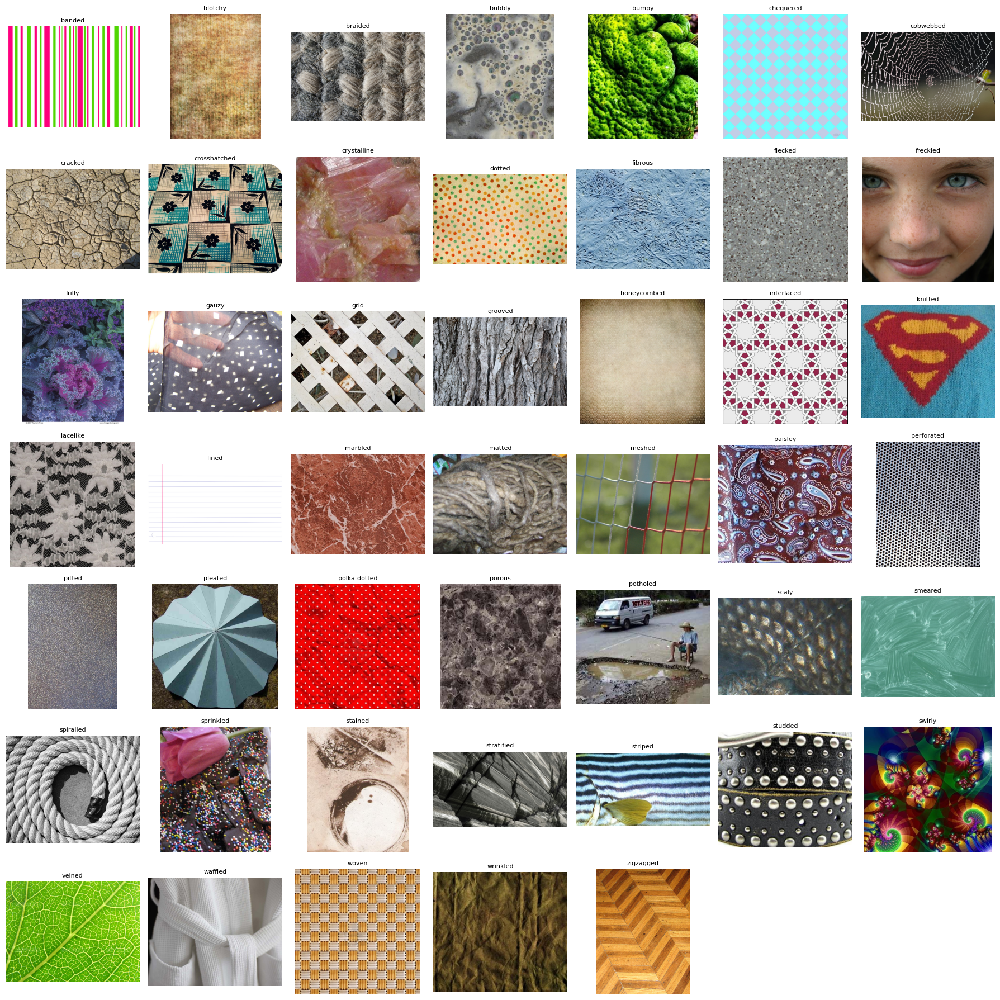

In [112]:
fig = plt.figure(figsize=(18,18))

for idx, row in sample_per_class.iterrows():
    img = cv2.imread(row["filepath"])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.subplot(7,7,idx+1)
    plt.imshow(img)
    plt.title(row["label"], fontsize=8)
    plt.axis("off")

plt.tight_layout()
plt.show()

## Checking for Corrupt Images

In [113]:
corrupted = []
for path in train_df["filepath"]:
    image = cv2.imread(path)
    if image is None:
        corrupted.append(path)

print("Corrupted Images :", len(corrupted))

Corrupted Images : 0


## Create Results Folder

In [114]:
RESULTS_PATH = os.path.join(PROJECT_PATH, "results")
FIGURES_PATH = os.path.join(PROJECT_PATH, "figures")
os.makedirs(RESULTS_PATH, exist_ok=True)
os.makedirs(FIGURES_PATH, exist_ok=True)

## Save Dataset Summary

In [115]:
dataset_summary.to_csv(
    os.path.join(RESULTS_PATH,
    "dataset_summary.csv"),
    index=False
)

class_counts.to_csv(
    os.path.join(RESULTS_PATH,
    "class_distribution.csv")
)

resolution_df.to_csv(
    os.path.join(RESULTS_PATH,
    "image_resolution_statistics.csv"),
    index=False
)

print("EDA tables saved successfully.")

EDA tables saved successfully.


# OpenCV Image Exploration

OpenCV is used to inspect and understand image characteristics before model training. This section demonstrates commonly used image processing techniques.

**Note:** These transformations are used for visualization and understanding the dataset. Only **resizing** and **normalization** will be used during model training.

## Using a sample image to demonstrate OpenCV operations

In [116]:
sample_path = train_df.sample(1, random_state=SEED).iloc[0]["filepath"]

print(sample_path)

/content/drive/MyDrive/Texture-Recognition-DTD/dtd-data/images/perforated/perforated_0145.jpg


In [117]:
# Read the sample image

image_bgr = cv2.imread(sample_path)
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

print(image_rgb.shape)

(541, 428, 3)


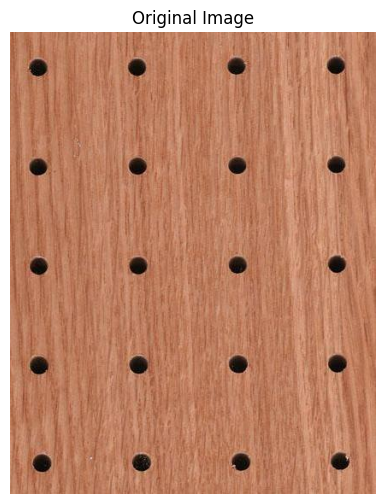

In [118]:
# Display Original Image

plt.figure(figsize=(6,6))
plt.imshow(image_rgb)
plt.title("Original Image")
plt.axis("off")
plt.show()

## Open CV Image Processing

In [119]:
# Resizing the Image
resized = cv2.resize(image_rgb, IMAGE_SIZE)

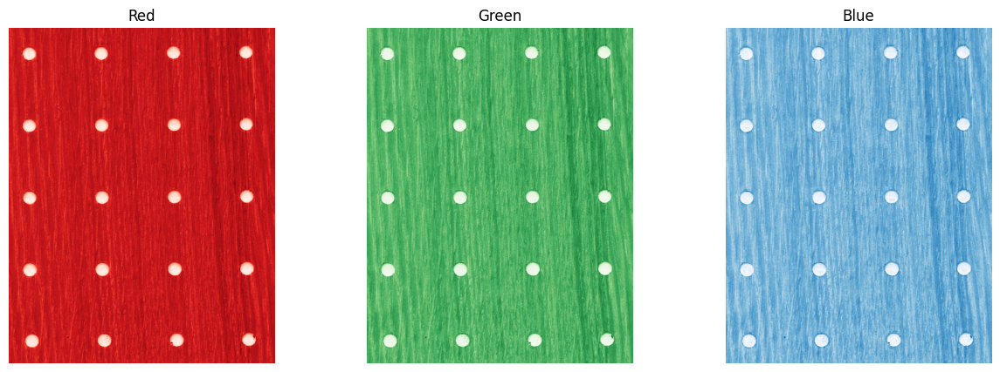

In [120]:
# RGB Channels
R = image_rgb[:,:,0]
G = image_rgb[:,:,1]
B = image_rgb[:,:,2]

# Display the RGB Channels
fig, ax = plt.subplots(1, 3, figsize=(15,5))
ax[0].imshow(R, cmap="Reds")
ax[0].set_title("Red")
ax[0].axis("off")
ax[1].imshow(G, cmap="Greens")
ax[1].set_title("Green")
ax[1].axis("off")
ax[2].imshow(B, cmap="Blues")
ax[2].set_title("Blue")
ax[2].axis("off")

plt.show()

In [121]:
# Grayscale Conversion
gray = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2GRAY)

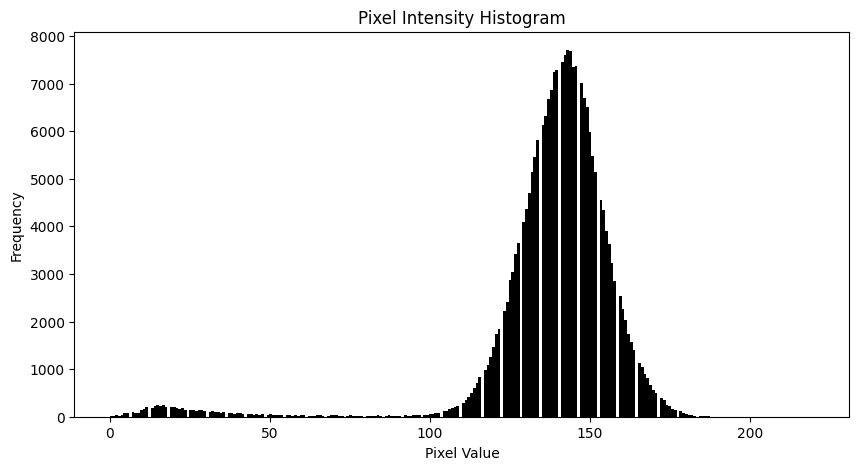

In [122]:
# Histogram
plt.figure(figsize=(10,5))
plt.hist(gray.ravel(), bins=256, color="black")

plt.title("Pixel Intensity Histogram")
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.show()

In [123]:
# Histogram Equalization
equalized = cv2.equalizeHist(gray)

In [124]:
# Gaussian Blur
blur = cv2.GaussianBlur(image_rgb, (5,5), 0)

In [125]:
# Edge Detection - Canny
edges = cv2.Canny(gray, 100, 200)

## Comparision of Image Processing Techniques

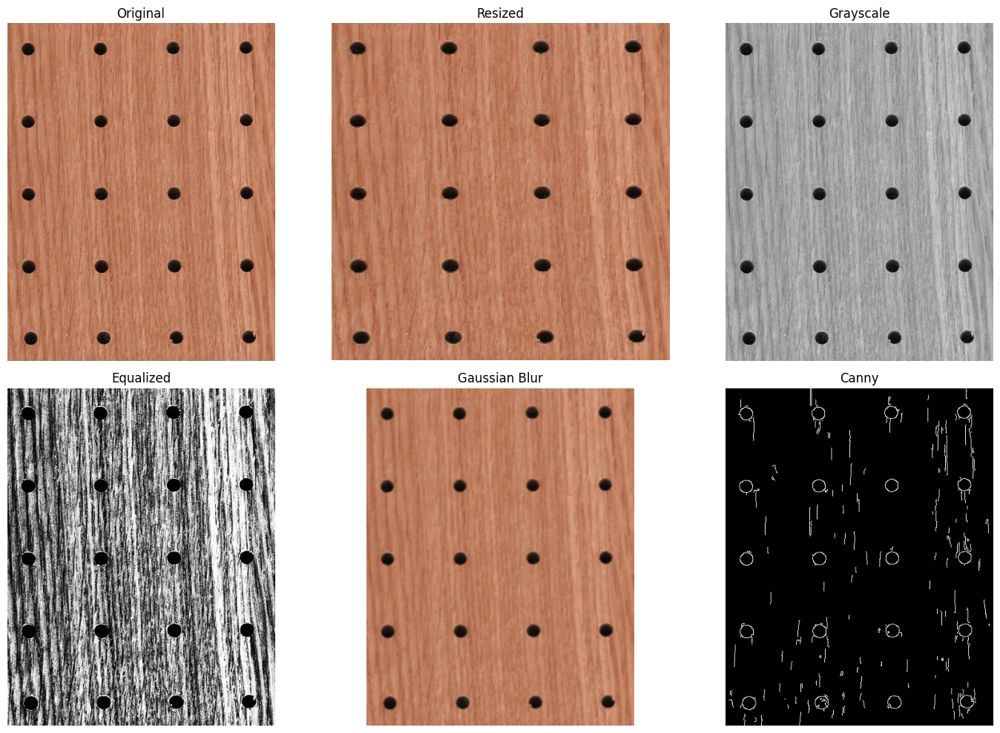

In [126]:
images = [image_rgb, resized, gray, equalized, blur, edges]

titles = ["Original", "Resized", "Grayscale", "Equalized", "Gaussian Blur", "Canny"]

plt.figure(figsize=(15,10))
for i in range(len(images)):
  plt.subplot(2,3,i+1)
  if len(images[i].shape)==2:
      plt.imshow(images[i], cmap="gray")
  else:
      plt.imshow(images[i])
  plt.title(titles[i])
  plt.axis("off")
plt.tight_layout()
plt.show()

# Training Configuration

In [127]:
IMG_HEIGHT = IMAGE_SIZE[0]
IMG_WIDTH = IMAGE_SIZE[1]

print(f"Target Image Size : {IMG_HEIGHT} x {IMG_WIDTH}")

Target Image Size : 224 x 224


# Image Loader Function

In [128]:
def load_and_preprocess_image(filepath, label):
    """
    Loads an image and performs preprocessing.
    Returns:
        image, label
    """
    image = tf.io.read_file(filepath)
    image = tf.io.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, IMAGE_SIZE)
    # Explicit normalization
    image = image / 255.0
    return image, label

# Label Encoder   

In [129]:
# Texture class names are converted into integer labels for model training.
label_encoder = LabelEncoder()
label_encoder.fit(train_df["label"])

train_df["label_encoded"] = label_encoder.transform(train_df["label"])
val_df["label_encoded"] = label_encoder.transform(val_df["label"])
test_df["label_encoded"] = label_encoder.transform(test_df["label"])

print("Number of Classes :", len(label_encoder.classes_))

Number of Classes : 47


# Save Label Mapping

In [130]:
label_mapping = pd.DataFrame({
    "Class_ID": range(len(label_encoder.classes_)),
    "Class_Name": label_encoder.classes_
})

display(label_mapping.head())
label_mapping.to_csv(
    os.path.join(RESULTS_PATH, "label_mapping.csv"),
    index=False
)

,Class_ID,Class_Name
0,0,banded
1,1,blotchy
2,2,braided
3,3,bubbly
4,4,bumpy


# Data Augmentation  
Data augmentation artificially increases training diversity without creating new image files.

Augmentation is applied **only during training**. Validation and test images remain unchanged.

In [131]:
# data_augmentation = Sequential([

#     layers.RandomFlip("horizontal"),
#     layers.RandomRotation(0.08),
#     layers.RandomZoom(0.10),
#     layers.RandomTranslation(0.05, 0.05),
#     layers.RandomContrast(0.10)
# ], name="data_augmentation")

# # Visualize augmentation
# sample_image = tf.io.read_file(train_df.iloc[0]["filepath"])
# sample_image = tf.image.decode_jpeg(sample_image, channels=3)
# sample_image = tf.image.resize(sample_image, IMAGE_SIZE)
# sample_image = tf.cast(sample_image, tf.float32)/255.

In [132]:
# # Display Augmented Images
# plt.figure(figsize=(12,12))

# for i in range(9):
#     ax = plt.subplot(3,3,i+1)
#     augmented = data_augmentation(tf.expand_dims(sample_image,0), training=True)
#     plt.imshow(augmented[0])
#     plt.axis("off")

# plt.tight_layout()
# plt.show()

# dataset Builder

In [133]:
def build_dataset(df, training=False):

    dataset = tf.data.Dataset.from_tensor_slices(
        (
            df["filepath"].values,
            df["label_encoded"].values
        )
    )

    dataset = dataset.map(
        load_and_preprocess_image,
        num_parallel_calls=AUTOTUNE
    )

    if training:
        dataset = dataset.shuffle(
            buffer_size=len(df),
            seed=SEED,
            reshuffle_each_iteration=True
        )

    # Batch BEFORE applying augmentation
    dataset = dataset.batch(BATCH_SIZE)

    # if training:                    # Augmentation
    #     dataset = dataset.map(
    #         lambda x, y: (data_augmentation(x, training=True), y),
    #         num_parallel_calls=AUTOTUNE
    #     )

    # if not training:
    #     dataset = dataset.cache()

    dataset = dataset.prefetch(AUTOTUNE)

    return dataset

# Dataset Objects

In [134]:
train_ds = build_dataset(train_df, training=True)

val_ds = build_dataset(val_df, training=False)

test_ds = build_dataset(test_df, training=False)

print(train_ds)
print(val_ds)
print(test_ds)

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int64, name=None))>
<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int64, name=None))>
<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int64, name=None))>


In [135]:
# Verifying

images, labels = next(iter(train_ds))
print(images.shape)
print(labels.shape)

print()

print(images.dtype)
print(labels.dtype)

print()

print(images.numpy().min())
print(images.numpy().max())

(32, 224, 224, 3)
(32,)

<dtype: 'float32'>
<dtype: 'int64'>

0.0
1.0


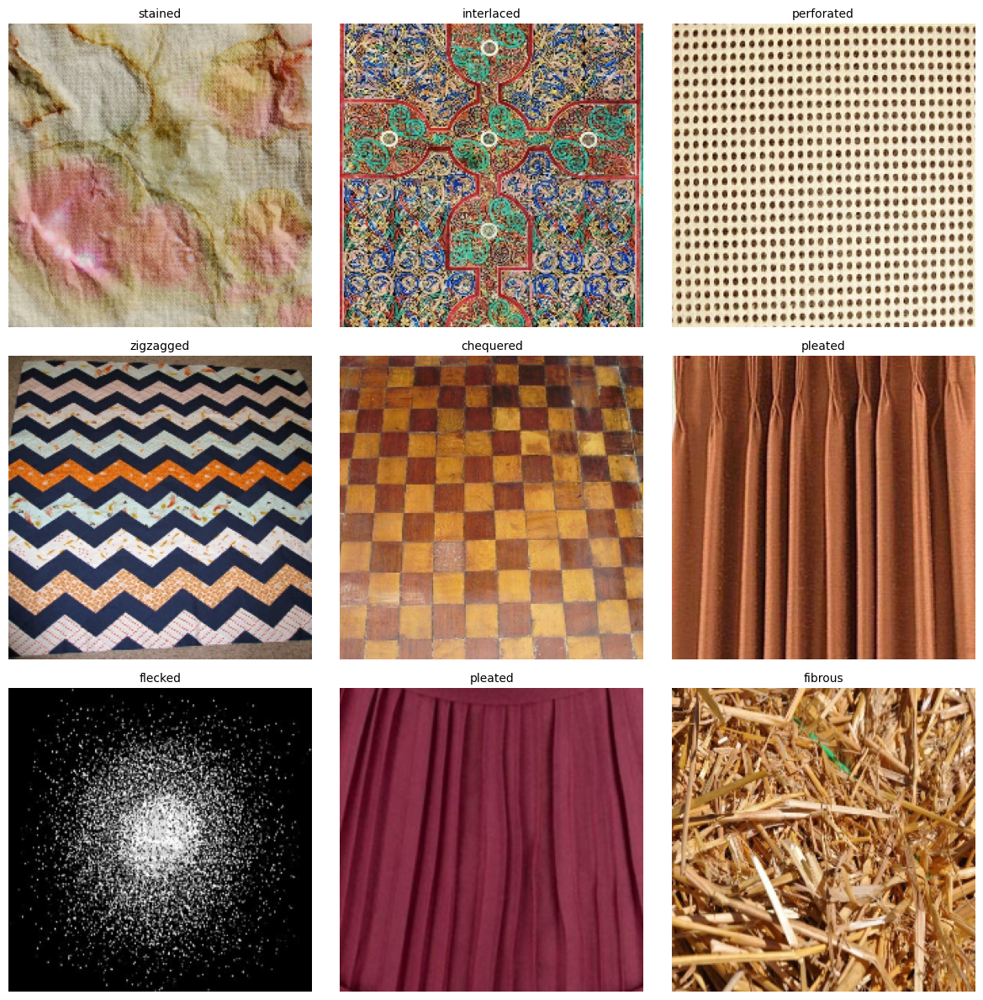

In [136]:
# Display Batch

plt.figure(figsize=(12,12))
for i in range(9):
    plt.subplot(3,3,i+1)
    plt.imshow(images[i])
    plt.title(
        label_encoder.inverse_transform([labels[i].numpy()])[0], fontsize=10)
    plt.axis("off")

plt.tight_layout()
plt.show()

# final configuration

In [137]:
print("=" * 60)
print("DATA PREPARATION COMPLETE")
print("=" * 60)

print(f"Classes          : {NUM_CLASSES}")
print(f"Image Size       : {IMAGE_SIZE}")
print(f"Batch Size       : {BATCH_SIZE}")
print(f"Training Images  : {len(train_df)}")
print(f"Validation Images: {len(val_df)}")
print(f"Testing Images   : {len(test_df)}")

print("\nNotebook 1 completed successfully.")

DATA PREPARATION COMPLETE
Classes          : 47
Image Size       : (224, 224)
Batch Size       : 32
Training Images  : 1880
Validation Images: 1880
Testing Images   : 1880

Notebook 1 completed successfully.
